In [2]:
from astropy.table import Table
from astropy.io import fits
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from PyAstronomy.pyasl import instrBroadGaussFast, rotBroad
from scipy.signal import savgol_filter
from PyAstronomy.pyasl import equidistantInterpolation
from scipy.optimize import curve_fit
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import os
from specutils.fitting import find_lines_derivative
import astropy.units as u
from specutils import Spectrum, SpectralRegion
from specutils.manipulation import noise_region_uncertainty, extract_region

In [3]:
t_lines = Table.read('/Users/student/Documents/YSOs-Research-Project-Data/lines 1.fits')
spectra_table = Table.read('/Users/student/Documents/YSOs-Research-Project-Data/data_table.fits')

wavelength_grid = np.linspace(15000, 17000, 10000)

teffs = spectra_table['teff']
yso_fluxes = spectra_table['yso_flux']
non_yso_fluxes = spectra_table['non_yso_flux']
yso_non_yso_differences = yso_fluxes  -  non_yso_fluxes

print(wavelength_grid.shape)

(10000,)


In [4]:
t_lines['lambda'] = t_lines['lambda'] * u.nm
t_lines['lambda'] = t_lines['lambda'].to(u.angstrom)

In [5]:
w_ranges = [
    (15281, 15284), (15296, 15301), (15329, 15335), (15338, 15341), (15393, 15400), (15410, 15414), (15431, 15434), (15498, 15502), 
    (15507, 15513), (15517, 15521), (15593, 15600), (15624, 15639), (15652, 15659), (15693, 15705), (15779, 15787), (15867, 15877), 
    (15929, 15935), (15984, 15990), (16040, 16044), (16056, 16060), (16063, 16067), (16076, 16083), (16097, 16102), (16126, 16135), 
    (16140, 16145), (16153, 16156), (16166, 16172), (16217, 16222), (16328, 16331), (16383, 16390), (16398, 16403), (16549, 16560), 
    (16564, 16568), (16608, 16614), (16617, 16620), (16718, 16726), (16730, 16736), 
]

# flux = np.mean(yso_fluxes, axis=0)
detected_lines = []

for i in range(len(yso_non_yso_differences)):
    flux = yso_non_yso_differences[i]
    spectrum = Spectrum(flux=flux * u.dimensionless_unscaled, spectral_axis=wavelength_grid * u.angstrom)
    
    for w_min, w_max in w_ranges:
        region = SpectralRegion(w_min * u.angstrom, w_max * u.angstrom)
        sub_spectrum = extract_region(spectrum, region)
    
        wavelength = sub_spectrum.spectral_axis.to(u.angstrom).value
        flx = np.abs(sub_spectrum.flux.value)
        idx_max = np.argmax(flx)
        line_w = wavelength[idx_max]
        height=flx[idx_max]
    
    
        # if (1 - flx[idx_min]) > (flx[idx_max] - 1):
        #     line_w = wavelength[idx_min]
        #     linetype = "absorption"
        #     height = np.abs(1 - flx[idx_min])
    
        # else:
        #     line_w = wavelength[idx_max]
        #     linetype = "emission"
        #     height = np.abs(flx[idx_max] - 1)
    
        detected_lines.append((line_w, height))

In [6]:
# plt.scatter(line_ws,heigths)

# mx=np.max(heigths)
# a=np.where(heigths>(mx*0.8))[0]
# average_w = np.average(np.array(line_ws)[a], weights=np.array(heigths)[a]**2)
# plt.axvline(x=average_w)

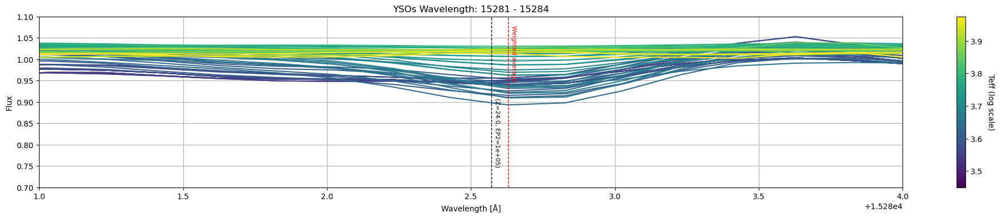

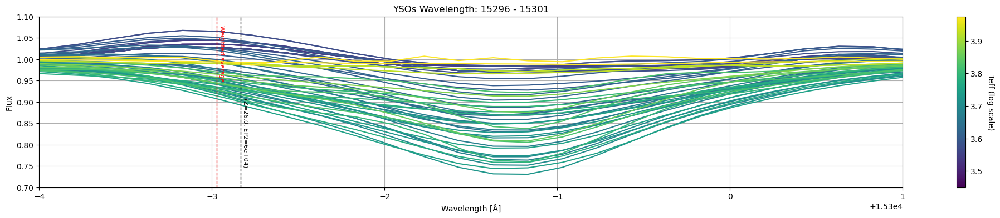

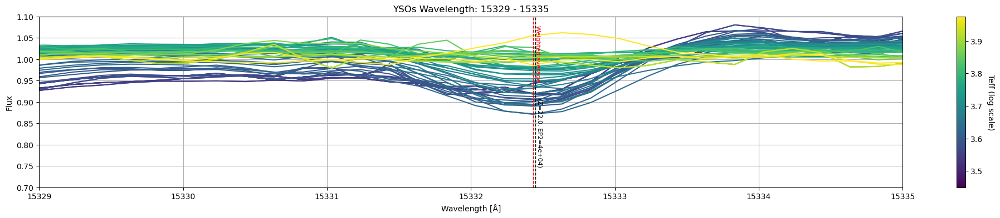

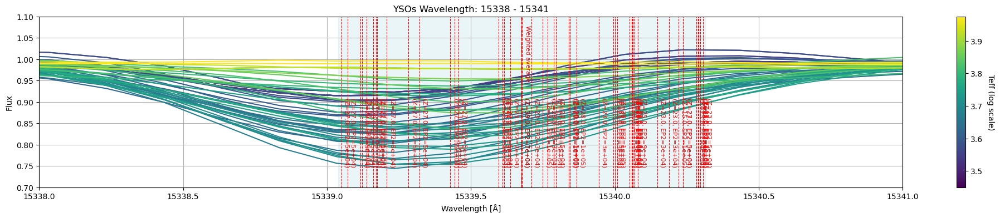

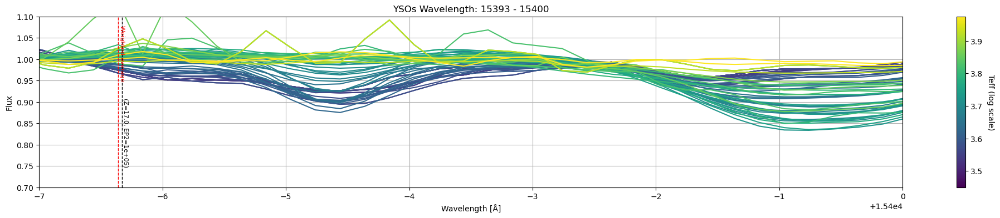

...

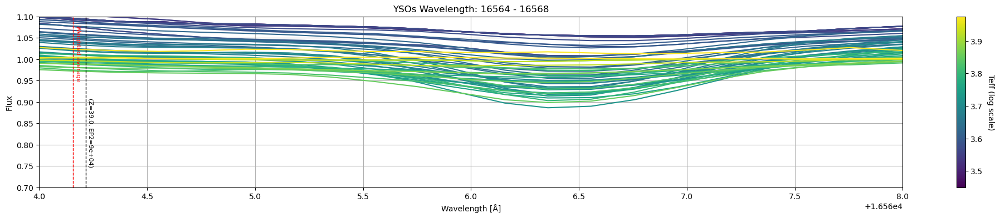

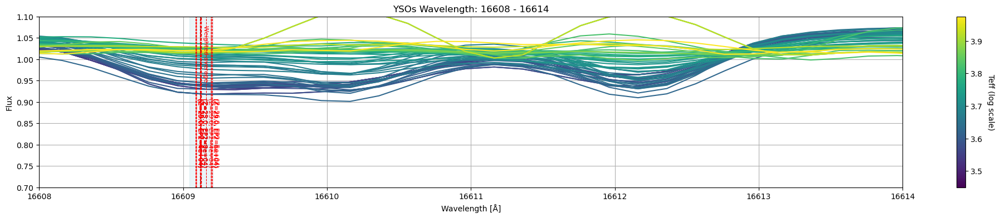

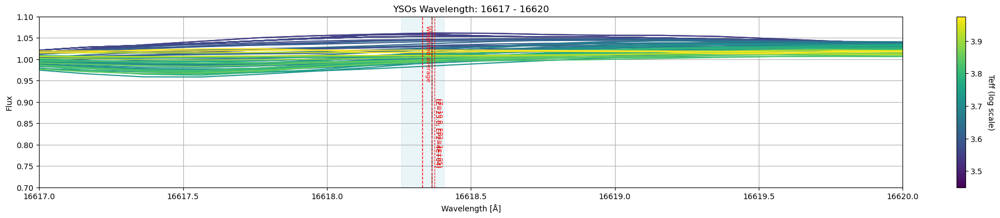

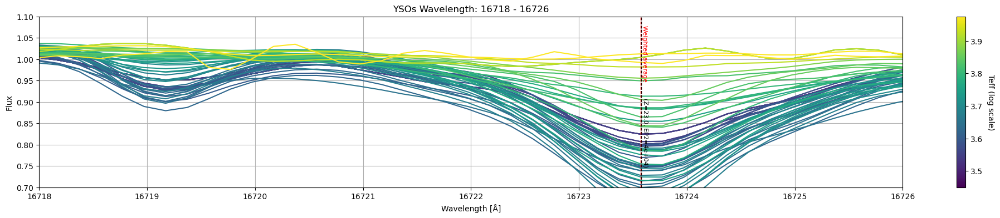

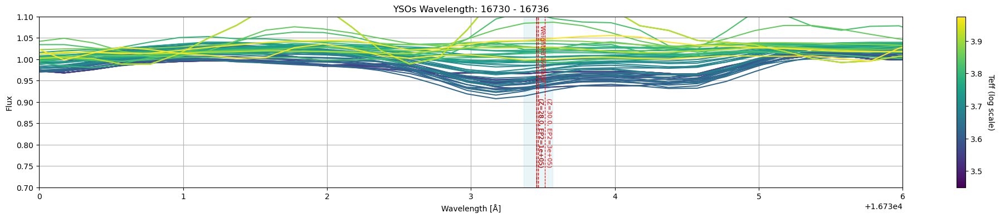

In [10]:
norm = mcolors.Normalize(vmin=np.min(teffs), vmax=np.max(teffs))
cmap = cm.viridis

for w_range in w_ranges:
    fig, ax = plt.subplots(figsize = (25, 4))
    
    for flux, teff in zip(yso_fluxes , teffs):
        color = cmap(norm(teff))
        ax.plot(wavelength_grid, flux, label = 'YSO', color = color, linewidth = 1.5) 
                
    line_ws = []
    heigths = [] 
    for line_w, height in detected_lines:
        if (line_w < w_range[1]) & (line_w > w_range[0]):
            line_ws.append(line_w)
            heigths.append(height) 

    mx=np.max(heigths)
    a=np.where(heigths>(mx*0.9))[0]
    std_dev = np.std(np.array(line_ws)[a])
    average_w = np.average(np.array(line_ws)[a], weights=np.array(heigths)[a]**2)
    diff = np.abs(t_lines['lambda'] - average_w)
    idx = np.argmin(diff)
    specid = t_lines['specid'][idx]
    EP2 = t_lines['EP2'][idx]
    table_w = t_lines['lambda'][idx]
    ax.fill_betweenx(y=[0.70, 1.10], x1=average_w - std_dev, x2=average_w + std_dev, color='lightblue', alpha=0.25)
    ax.axvline(table_w, color='black', linestyle='--', linewidth=1)
    ax.text(table_w + 0.01, 0.75, f'(Z={specid:.1f}, EP2={EP2:.1})', color="black", rotation=270, fontsize=8)
    ax.axvline(average_w, color='red', linestyle='--', linewidth=1)
    ax.text(average_w + 0.01, 0.95, "Weighted average", color="red", rotation=270, fontsize=8)

    a=np.where((t_lines['lambda'] < (average_w + std_dev)) & (t_lines['lambda'] > (average_w - std_dev)))[0]

    for i in range(len(t_lines[a])):
        specid = t_lines[a]['specid'][i]
        EP2 = t_lines[a]['EP2'][i]
        ax.axvline(t_lines[a]['lambda'][i], color='red', linestyle='--', linewidth=0.8)
        ax.text(t_lines[a]['lambda'][i] + 0.01, 0.75, f'(Z={specid:.1f}, EP2={EP2:.1})', color="red", rotation=270, fontsize=8)
             
    ax.set_xlim(w_range[0], w_range[1])
    ax.set_ylim(0.70, 1.10)
    ax.set_xlabel("Wavelength [Å]")
    ax.set_ylabel("Flux")
    ax.set_title(f'YSOs Wavelength: {w_range[0]} - {w_range[1]}')
    ax.grid(True)
    
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label("Teff (log scale)", rotation=270, labelpad=15)

    # plt.tight_layout()
    plt.show()